In [1]:
import spatialmath as sp

In [2]:
RA = sp.SO3()

RB = sp.SO3.Rz(90,unit='deg')

In [3]:
print('Rotacion inicial',RA)
print('Rotacion 90 grados en Z',RB)

Rotacion inicial    1         0         0         
   0         1         0         
   0         0         1         

Rotacion 90 grados en Z    0        -1         0         
   1         0         0         
   0         0         1         



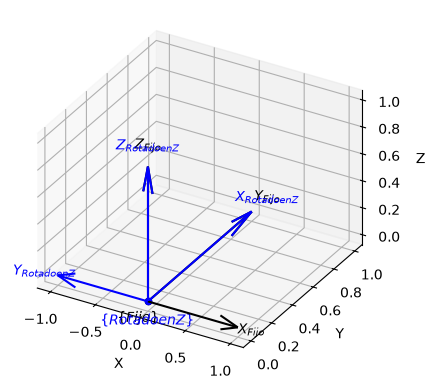

In [4]:
RA.plot(frame='Fijo',color='black')
RB.plot(frame='Rotado en Z',color='blue')

In [5]:
from spatialmath.base import tranimate
import matplotlib.pyplot as plt
from IPython.display import HTML


In [6]:
anim = tranimate(
    RB.R,               # Extrae la matriz SO(3) subyacente
    frame='B',          # Etiqueta para el sistema de ejes móvil
    color='blue',       # Color de las flechas
    arrow=True,         # Dibuja puntas de flecha
    nframes=60,         # Número de pasos
    fps=30,              # Fotogramas por segundo
    dims=[-2, 2, -2, 2, -2, 2]
)

plt.close()

HTML(anim.to_jshtml())


Lo que se busca hacer en `RBzy` y `RBzyx`, es ir creando la composicion de matrices de rotacion, donde lo unico que se hace es multiplicarlas, a este proceso se le conoce como **post multiplicacion**

En caso de tener 
`sp.SO3.Ry(Ang_y,unit='deg') * RBz` 

Se le llama **premultiplicacion**, y es un proceso diferente, que da un resultado diferente por obviedad

En la postmultiplicacion se rota sobre *ejes moviles* y en la premultiplicacion sobre *ejes fijos del mundo*.

In [7]:
# 1. Definir las poses inicial y final

Ang_z = 90
Ang_y = 45
Ang_x = 30

RBz = sp.SO3.Rz(Ang_z,unit='deg') 
RBzy = RBz * sp.SO3.Ry(Ang_y,unit='deg')
RBzyx = RBzy * sp.SO3.Rx(Ang_x,unit='deg')

Generamos la interpolacion de matrices de rotacion, colocando:
**`Matriz o punto de inicio`**.*`interp`*(**`Matriz o punto final`**,`interpolaciones totales`)

A mayor cantidad de interpolaciones, mas pesado sera renderizar la animacion

In [8]:
trayectoria0Z = RA.interp(RBz,50)
trayectoriaZY  = RBz.interp(RBzy,50)
trayectoriaZYX = RBzy.interp(RBzyx,50)

`[pose.A for pose in trayectoria]` revisa cada elemento `(pose)` dentro de trayectoria y extrae únicamente su propiedad `A`

El signo + junta las dos listas resultantes en una sola lista más larga. Despues guarda todo en `matriz_total`

In [9]:
matriz_total = ([pose.A for pose in trayectoria0Z]+[pose.A for pose in trayectoriaZY]+[pose.A for pose in trayectoriaZYX])

Aqui lo que buscamos es crear una animación partiendo de las interpolaciones y de haberlas concatenado en una **`matriz_total`**

Para ello, primero se determina la variable *`fig`* que genera la figura limpia donde vamos a graficar

El *`trplot`* nos grafica el eje fijo, basado en la matriz identidad

Con tranimate, le pasamos la **"matriz total"** que son los valores a animar en secuencia

Con `ax` obtenemos el valor actual del eje, que nos servira para colocar la leyenda y el titulo a la animacion

Por ultimo el `plt.close` permite cerrar la ventana generada por matplotlib y solo deja abierta la generada por spatial para renderizar la animacion en el notebook con la funcion HTML

In [10]:
import matplotlib.lines as mlines
import matplotlib.pyplot as plt
from spatialmath.base import trplot

# 1. Crear una figura limpia ANTES de graficar para evitar basura en caché
fig = plt.figure()

trplot(RA.A,frame='A',color='black')

anim = tranimate(matriz_total,color='blue',frame='B',dims=[-2,2],repeat=False)

ax = plt.gca()

leyenda_a = mlines.Line2D([],[],color='black',label='Sistema Fijo')
leyenda_b = mlines.Line2D([],[],color='blue',label='Sistema Rotado')
ax.legend(handles=[leyenda_a,leyenda_b],loc='upper left')
ax.set_title('Animacion de Rotacion')

plt.close()

HTML(anim.to_jshtml())

<Figure size 640x480 with 0 Axes>